In [12]:
# Import libraries
import librosa
import librosa.display
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from matplotlib.pyplot import specgram
import pandas as pd
import glob 
from sklearn.metrics import confusion_matrix
import IPython.display as ipd  # To play sound in the notebook
import os
import sys
import warnings
# ignore warnings 
if not sys.warnoptions:
    warnings.simplefilter("ignore")
warnings.filterwarnings("ignore", category=DeprecationWarning)

In [13]:
RAV ="C:\\Ravdes\\RAVDESS\\audio_speech_actors_01-24\\"
print(RAV)

C:\Ravdes\RAVDESS\audio_speech_actors_01-24\


In [14]:
dir_list = os.listdir(RAV)
dir_list.sort()

emotion = []
gender = []
path = []
for i in dir_list:
    fname = os.listdir(RAV + i)
    for f in fname:
        part = f.split('.')[0].split('-')
        emotion.append(int(part[2]))
        temp = int(part[6])
        if temp%2 == 0:
            temp = "F"
        else:
            temp = "M"
        gender.append(temp)
        path.append(RAV + i + '/' + f)

        
RAV_df = pd.DataFrame(emotion)
RAV_df = RAV_df.replace({1:'neutral', 2:'calm', 3:'happy', 4:'sad', 5:'angry', 6:'fear', 7:'disgust', 8:'surprise'})
RAV_df = pd.concat([pd.DataFrame(gender),RAV_df],axis=1)
RAV_df.columns = ['gender','emotion']
RAV_df['labels'] =RAV_df.gender + '_' + RAV_df.emotion
RAV_df['source'] = 'RAVDESS'  
RAV_df = pd.concat([RAV_df,pd.DataFrame(path, columns = ['path'])],axis=1)
RAV_df = RAV_df.drop(['gender', 'emotion'], axis=1)
RAV_df.labels.value_counts()

F_sad         96
F_surprise    96
F_happy       96
F_disgust     96
M_happy       96
F_fear        96
M_sad         96
F_calm        96
M_calm        96
M_disgust     96
M_angry       96
M_fear        96
M_surprise    96
F_angry       96
F_neutral     48
M_neutral     48
Name: labels, dtype: int64

In [5]:
RAV_df.head(7)

,labels,source,path
0,M_neutral,RAVDESS,C:\Ravdes\RAVDESS\audio_speech_actors_01-24\Ac...
1,M_neutral,RAVDESS,C:\Ravdes\RAVDESS\audio_speech_actors_01-24\Ac...
2,M_neutral,RAVDESS,C:\Ravdes\RAVDESS\audio_speech_actors_01-24\Ac...
3,M_neutral,RAVDESS,C:\Ravdes\RAVDESS\audio_speech_actors_01-24\Ac...
4,M_neutral,RAVDESS,C:\Ravdes\RAVDESS\audio_speech_actors_01-24\Ac...
5,M_neutral,RAVDESS,C:\Ravdes\RAVDESS\audio_speech_actors_01-24\Ac...
6,M_neutral,RAVDESS,C:\Ravdes\RAVDESS\audio_speech_actors_01-24\Ac...


In [6]:
RAV_df.describe()

,labels,source,path
count,1440,1440,1440
unique,14,1,1440
top,F_neutral,RAVDESS,C:\Ravdes\RAVDESS\audio_speech_actors_01-24\Ac...
freq,144,1440,1


In [11]:
RAV_df.labels.unique()

array(['M_neutral', 'M_happy', 'M_sad', 'M_angry', 'M_fear', 'M_disgust',
       'M_surprise', 'F_neutral', 'F_happy', 'F_sad', 'F_angry', 'F_fear',
       'F_disgust', 'F_surprise'], dtype=object)

In [8]:
RAV_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1440 entries, 0 to 1439
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   labels  1440 non-null   object
 1   source  1440 non-null   object
 2   path    1440 non-null   object
dtypes: object(3)
memory usage: 33.9+ KB


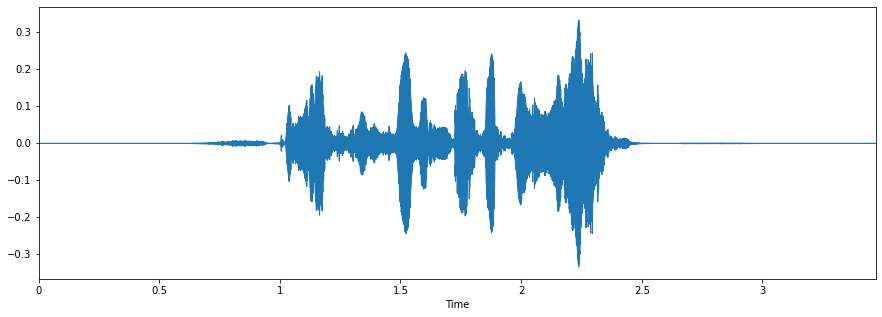

In [15]:
# Pick a fearful track
fname = RAV + 'Actor_14/03-01-06-02-02-02-14.wav'  
data, sampling_rate = librosa.load(fname)
plt.figure(figsize=(15, 5))
librosa.display.waveplot(data, sr=sampling_rate)

# play the audio 
ipd.Audio(fname)

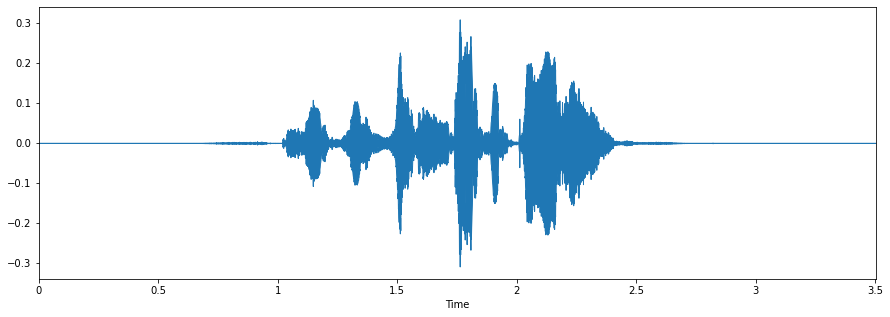

In [16]:
# Pick a fearful track
fname = RAV + 'Actor_14/03-01-06-02-02-01-14.wav'  
data, sampling_rate = librosa.load(fname)
plt.figure(figsize=(15, 5))
librosa.display.waveplot(data, sr=sampling_rate)

# play the audio 
ipd.Audio(fname)

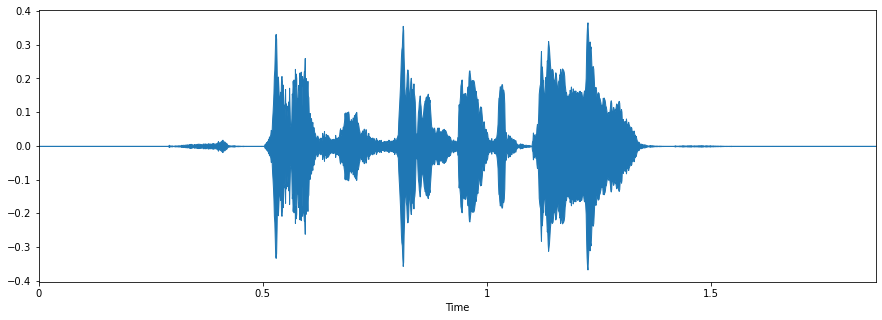

In [17]:
# Pick a happy track
fname = RAV + 'Actor_14/03-01-03-02-02-02-14.wav'  
data, sampling_rate = librosa.load(fname)
plt.figure(figsize=(15, 5))
librosa.display.waveplot(data, sr=sampling_rate)

# Lets play the audio 
ipd.Audio(fname)

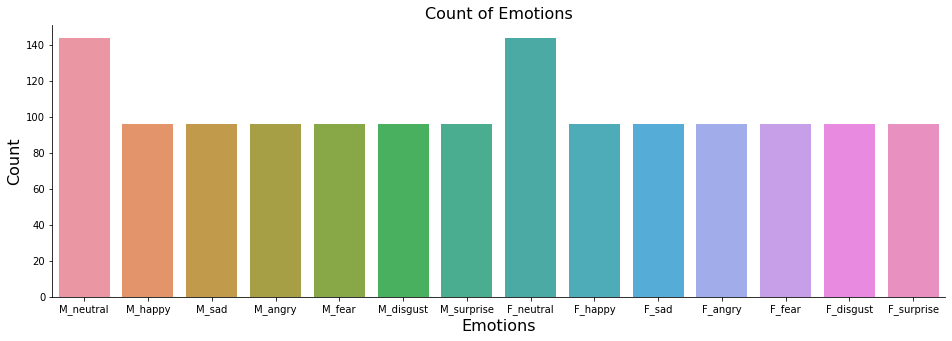

In [39]:
import seaborn as sns
plt.figure(figsize=(16,5))
plt.title('Count of Emotions', size=16)
sns.countplot(RAV_df.labels)
plt.ylabel('Count', size=16)
plt.xlabel('Emotions', size=16)
#plt.xticks(rotation=90)
sns.despine(top=True, right=True, left=False, bottom=False)

plt.show()

# ENERGY

In [48]:
from IPython.display import Audio
from IPython.display import display

In [49]:
def create_waveplot(data, sr, e):
    plt.figure(figsize=(10, 3))
    plt.title('Waveplot for {} emotion'.format(e), size=15)
    librosa.display.waveplot(data, sr=sr)
    plt.show()

def create_spectrogram(data, sr, e):
    X = librosa.stft(data)
    Xdb = librosa.amplitude_to_db(abs(X))
    plt.figure(figsize=(12, 3))
    plt.title('Spectrogram for {} emotion'.format(e), size=15)
    librosa.display.specshow(Xdb, sr=sr, x_axis='time', y_axis='hz')   
    plt.colorbar()

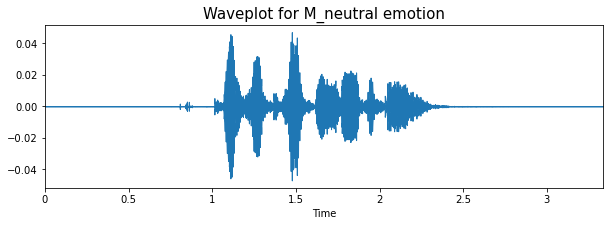

(73574,)


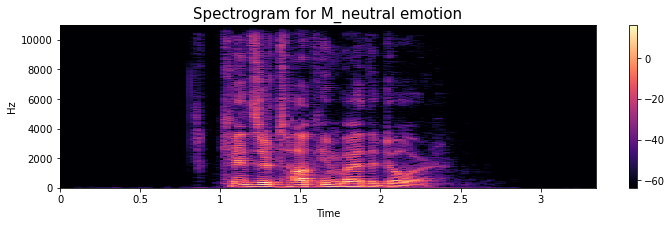

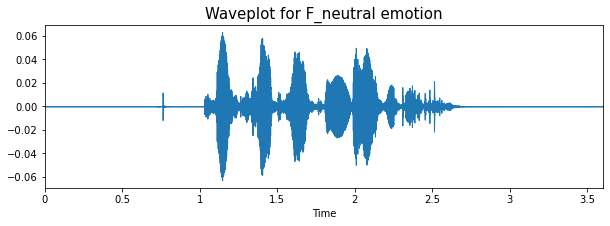

(79460,)


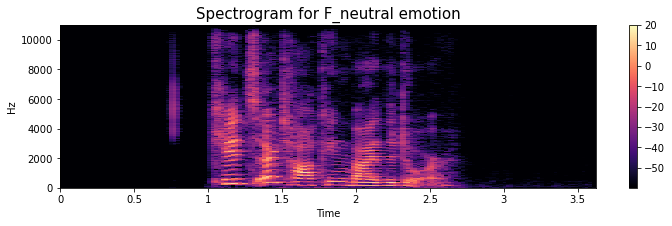

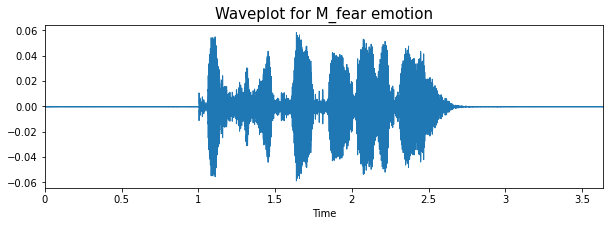

(80196,)


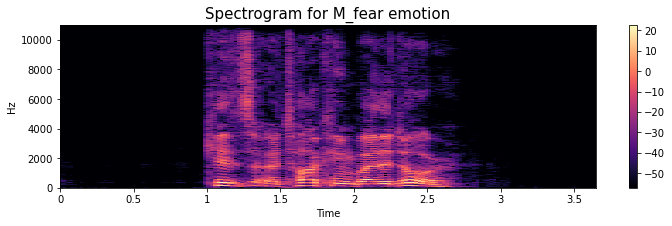

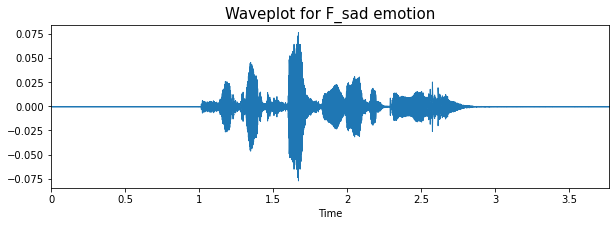

(83139,)


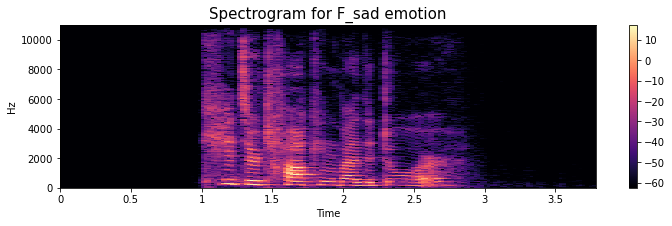

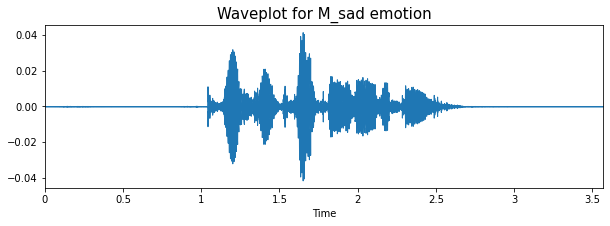

(78724,)


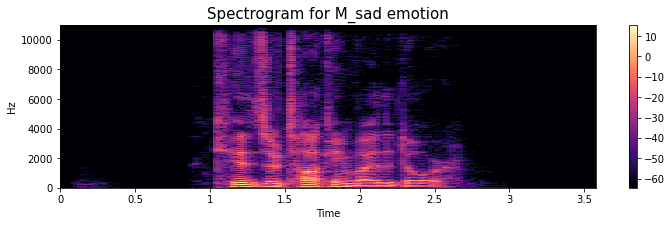

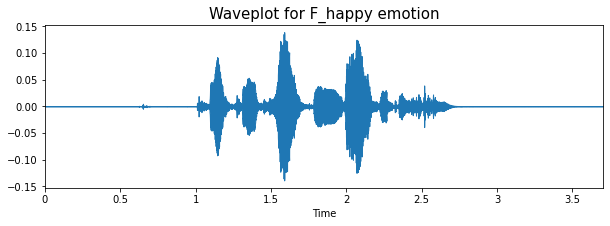

(81667,)


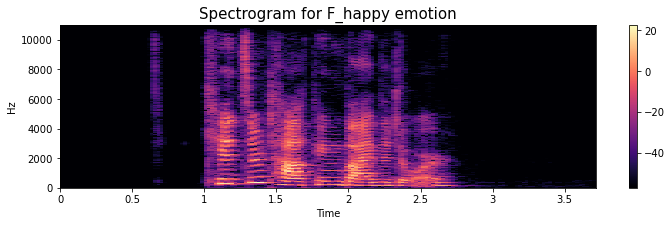

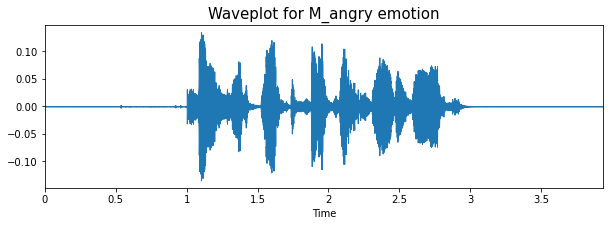

(86817,)


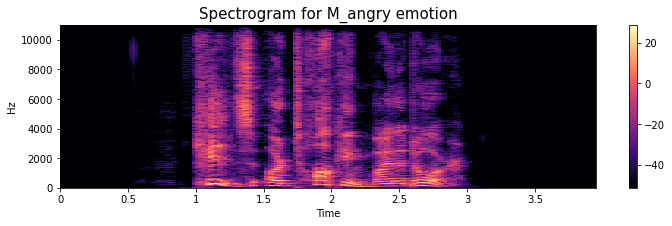

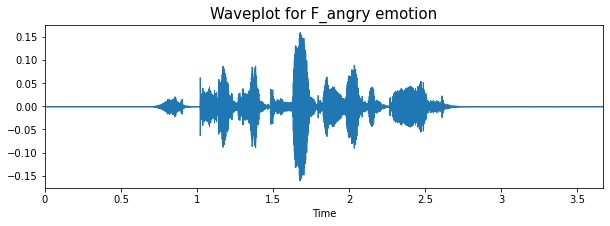

(80931,)


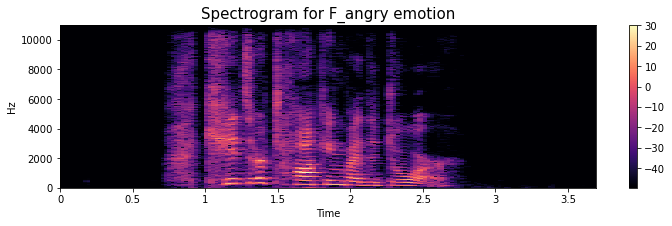

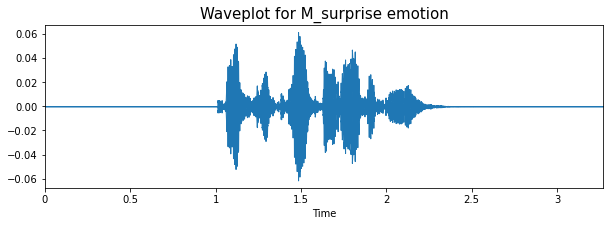

(72102,)


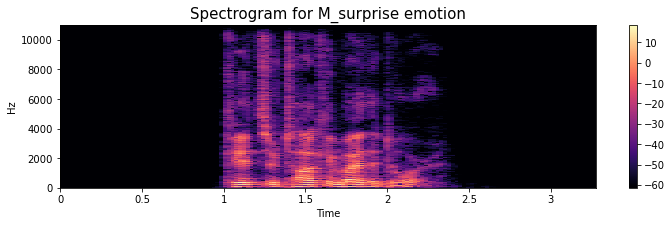

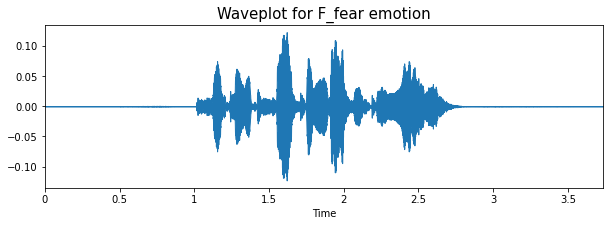

(82403,)


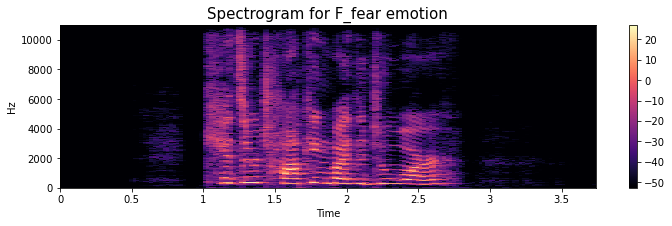

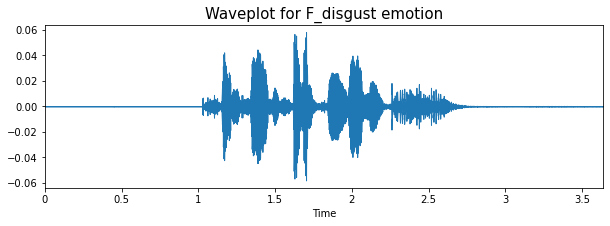

(80196,)


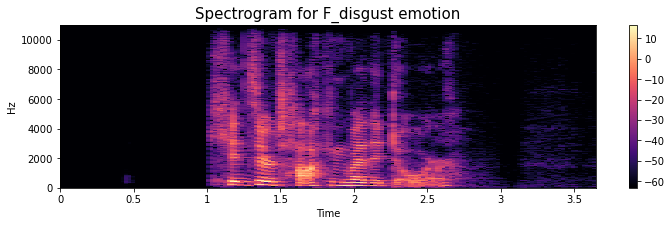

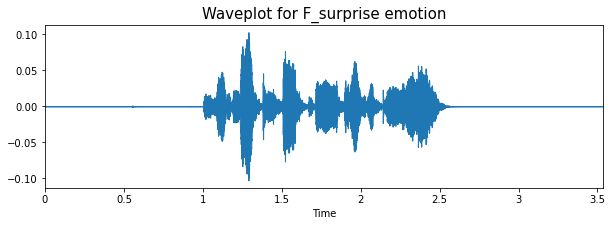

(77988,)


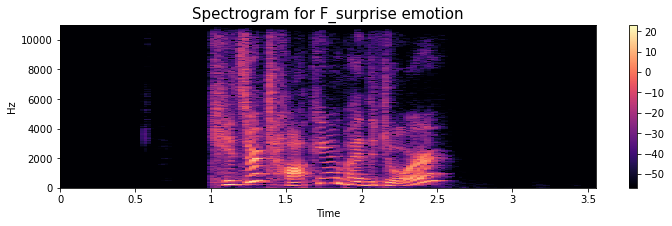

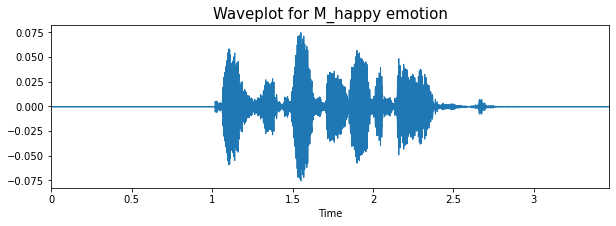

(76517,)


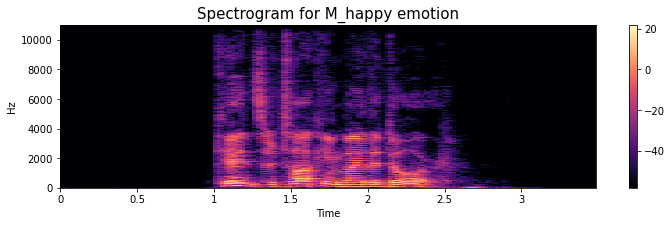

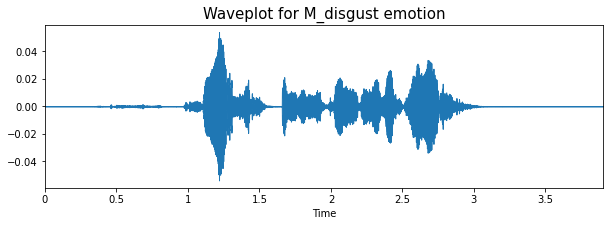

(86081,)


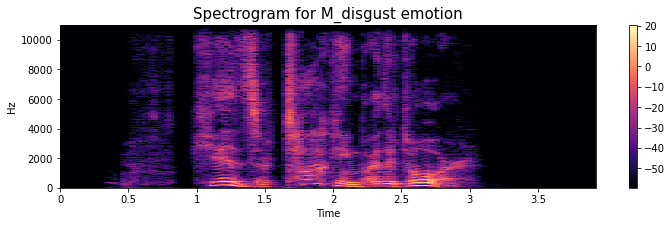

In [50]:
emotions = ['M_neutral', 'F_neutral', 'M_fear', 'F_sad', 'M_sad', 'F_happy','M_angry','F_angry','M_surprise','F_fear','F_disgust',
           'F_surprise','M_happy','M_disgust']
for emotion in emotions:
    path = np.array(RAV_df.path[RAV_df.labels==emotion])[1]
    data, sampling_rate = librosa.load(path)
    create_waveplot(data, sampling_rate, emotion)
    create_spectrogram(data, sampling_rate, emotion)
    display(Audio(path))
    print(data.shape)

# MFCC

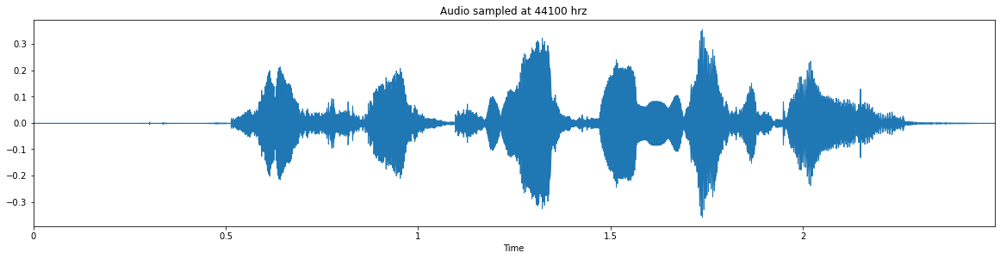

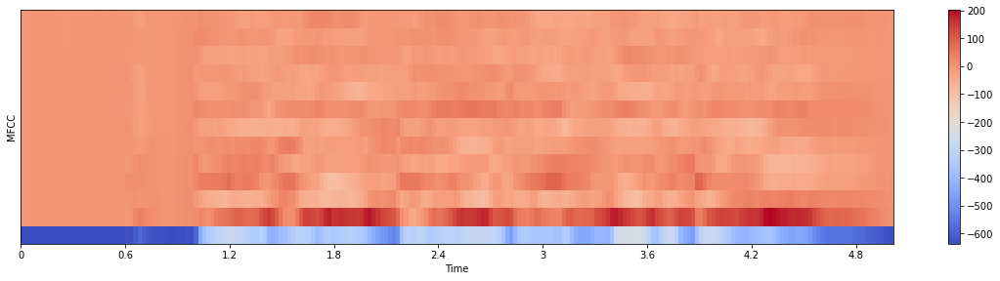

In [53]:
# Source - RAVDESS; Gender - Female; Emotion - Angry 
path = "C:\\Ravdes\\RAVDESS\\audio_speech_actors_01-24\\Actor_08\\03-01-05-02-01-01-08.wav"
X, sample_rate = librosa.load(path, res_type='kaiser_fast',duration=2.5,sr=22050*2,offset=0.5)  
mfcc = librosa.feature.mfcc(y=X, sr=sample_rate, n_mfcc=13)

# audio wave
plt.figure(figsize=(20, 15))
plt.subplot(3,1,1)
librosa.display.waveplot(X, sr=sample_rate)
plt.title('Audio sampled at 44100 hrz')

# MFCC
plt.figure(figsize=(20, 15))
plt.subplot(3,1,1)
librosa.display.specshow(mfcc, x_axis='time')
plt.ylabel('MFCC')
plt.colorbar()

ipd.Audio(path)

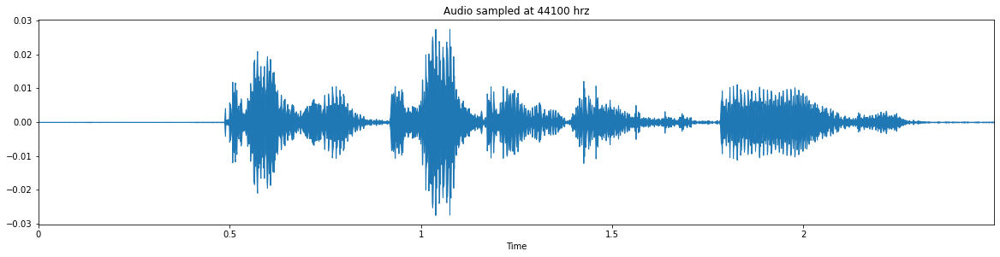

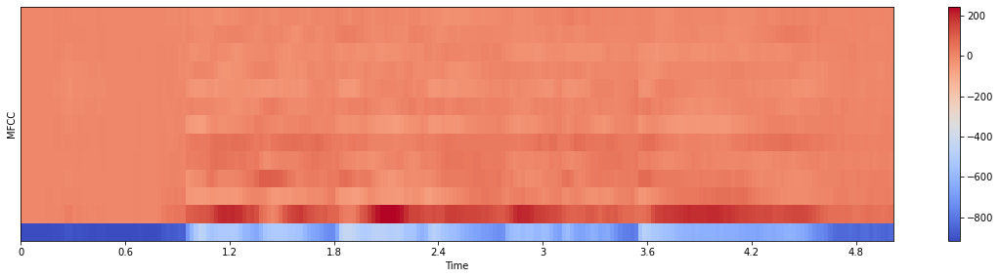

In [54]:
# Source - RAVDESS; Gender - Male; Emotion - Angry 
path = "C:\\Ravdes\\RAVDESS\\audio_speech_actors_01-24\\Actor_09\\03-01-05-01-01-01-09.wav"
X, sample_rate = librosa.load(path, res_type='kaiser_fast',duration=2.5,sr=22050*2,offset=0.5)  
mfcc = librosa.feature.mfcc(y=X, sr=sample_rate, n_mfcc=13)

# audio wave
plt.figure(figsize=(20, 15))
plt.subplot(3,1,1)
librosa.display.waveplot(X, sr=sample_rate)
plt.title('Audio sampled at 44100 hrz')

# MFCC
plt.figure(figsize=(20, 15))
plt.subplot(3,1,1)
librosa.display.specshow(mfcc, x_axis='time')
plt.ylabel('MFCC')
plt.colorbar()

ipd.Audio(path)